In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
from sklearn.pipeline import Pipeline
from sklearn import tree
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import confusion_matrix
from sklearn.tree import DecisionTreeClassifier
from sklearn import preprocessing
from scipy.stats import norm
import statistics
import pandas_profiling as pf
from pandas_profiling import ProfileReport


/var/folders/jp/52lg7vhx5xqc9l1fx_d3rk300000gn/T/ipykernel_11880/3644537017.py:19: DeprecationWarning: `import pandas_profiling` is going to be deprecated by April 1st. Please use `import ydata_profiling` instead.
  import pandas_profiling as pf


In [2]:
data=pd.read_csv('cancer_data.csv')

In [3]:
data.head()

,id,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,...,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst,Unnamed: 32
0,842302,M,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.3001,0.14710,...,17.33,184.60,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890,NaN
1,842517,M,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.0869,0.07017,...,23.41,158.80,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902,NaN
2,84300903,M,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.1974,0.12790,...,25.53,152.50,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758,NaN
3,84348301,M,11.42,20.38,77.58,386.1,0.14250,0.28390,0.2414,0.10520,...,26.50,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.17300,NaN
4,84358402,M,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.1980,0.10430,...,16.67,152.20,1575.0,0.1374,0.2050,0.4000,0.1625,0.2364,0.07678,NaN


In [4]:
data['Unnamed: 32'].head()

0   NaN
1   NaN
2   NaN
3   NaN
4   NaN
Name: Unnamed: 32, dtype: float64

In [5]:
kk=data.copy()

In [6]:
kk.shape

(569, 33)

In [7]:
kk.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 569 entries, 0 to 568
Data columns (total 33 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   id                       569 non-null    int64  
 1   diagnosis                569 non-null    object 
 2   radius_mean              569 non-null    float64
 3   texture_mean             569 non-null    float64
 4   perimeter_mean           569 non-null    float64
 5   area_mean                569 non-null    float64
 6   smoothness_mean          569 non-null    float64
 7   compactness_mean         569 non-null    float64
 8   concavity_mean           569 non-null    float64
 9   concave points_mean      569 non-null    float64
 10  symmetry_mean            569 non-null    float64
 11  fractal_dimension_mean   569 non-null    float64
 12  radius_se                569 non-null    float64
 13  texture_se               569 non-null    float64
 14  perimeter_se             5

In [8]:
kk.describe()

,id,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,...,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst,Unnamed: 32
count,5.690000e+02,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,...,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,0.0
mean,3.037183e+07,14.127292,19.289649,91.969033,654.889104,0.096360,0.104341,0.088799,0.048919,0.181162,...,25.677223,107.261213,880.583128,0.132369,0.254265,0.272188,0.114606,0.290076,0.083946,NaN
std,1.250206e+08,3.524049,4.301036,24.298981,351.914129,0.014064,0.052813,0.079720,0.038803,0.027414,...,6.146258,33.602542,569.356993,0.022832,0.157336,0.208624,0.065732,0.061867,0.018061,NaN
min,8.670000e+03,6.981000,9.710000,43.790000,143.500000,0.052630,0.019380,0.000000,0.000000,0.106000,...,12.020000,50.410000,185.200000,0.071170,0.027290,0.000000,0.000000,0.156500,0.055040,NaN
25%,8.692180e+05,11.700000,16.170000,75.170000,420.300000,0.086370,0.064920,0.029560,0.020310,0.161900,...,21.080000,84.110000,515.300000,0.116600,0.147200,0.114500,0.064930,0.250400,0.071460,NaN
50%,9.060240e+05,13.370000,18.840000,86.240000,551.100000,0.095870,0.092630,0.061540,0.033500,0.179200,...,25.410000,97.660000,686.500000,0.131300,0.211900,0.226700,0.099930,0.282200,0.080040,NaN
75%,8.813129e+06,15.780000,21.800000,104.100000,782.700000,0.105300,0.130400,0.130700,0.074000,0.195700,...,29.720000,125.400000,1084.000000,0.146000,0.339100,0.382900,0.161400,0.317900,0.092080,NaN
max,9.113205e+08,28.110000,39.280000,188.500000,2501.000000,0.163400,0.345400,0.426800,0.201200,0.304000,...,49.540000,251.200000,4254.000000,0.222600,1.058000,1.252000,0.291000,0.663800,0.207500,NaN


In [9]:
kk['diagnosis'].value_counts()

diagnosis
B    357
M    212
Name: count, dtype: int64

In [10]:
kk.isnull().sum()

id                           0
diagnosis                    0
radius_mean                  0
texture_mean                 0
perimeter_mean               0
area_mean                    0
smoothness_mean              0
compactness_mean             0
concavity_mean               0
concave points_mean          0
symmetry_mean                0
fractal_dimension_mean       0
radius_se                    0
texture_se                   0
perimeter_se                 0
area_se                      0
smoothness_se                0
compactness_se               0
concavity_se                 0
concave points_se            0
symmetry_se                  0
fractal_dimension_se         0
radius_worst                 0
texture_worst                0
perimeter_worst              0
area_worst                   0
smoothness_worst             0
compactness_worst            0
concavity_worst              0
concave points_worst         0
symmetry_worst               0
fractal_dimension_worst      0
Unnamed:

In [11]:
kk.dropna(axis=1,inplace=True) # or use kk.drop(['Unnamed: 32'],axis=1,inplace=True)

In [12]:
kk.isnull().sum()

id                         0
diagnosis                  0
radius_mean                0
texture_mean               0
perimeter_mean             0
area_mean                  0
smoothness_mean            0
compactness_mean           0
concavity_mean             0
concave points_mean        0
symmetry_mean              0
fractal_dimension_mean     0
radius_se                  0
texture_se                 0
perimeter_se               0
area_se                    0
smoothness_se              0
compactness_se             0
concavity_se               0
concave points_se          0
symmetry_se                0
fractal_dimension_se       0
radius_worst               0
texture_worst              0
perimeter_worst            0
area_worst                 0
smoothness_worst           0
compactness_worst          0
concavity_worst            0
concave points_worst       0
symmetry_worst             0
fractal_dimension_worst    0
dtype: int64

In [30]:
kk.drop(['id'],axis=1,inplace=True)

In [13]:
kk.dtypes

id                           int64
diagnosis                   object
radius_mean                float64
texture_mean               float64
perimeter_mean             float64
area_mean                  float64
smoothness_mean            float64
compactness_mean           float64
concavity_mean             float64
concave points_mean        float64
symmetry_mean              float64
fractal_dimension_mean     float64
radius_se                  float64
texture_se                 float64
perimeter_se               float64
area_se                    float64
smoothness_se              float64
compactness_se             float64
concavity_se               float64
concave points_se          float64
symmetry_se                float64
fractal_dimension_se       float64
radius_worst               float64
texture_worst              float64
perimeter_worst            float64
area_worst                 float64
smoothness_worst           float64
compactness_worst          float64
concavity_worst     

In [14]:
kk.groupby('diagnosis').sum()

,id,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,...,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
diagnosis,,,,,,,,,,,,,,,,,,,,,
B,9476145391,4336.309,6395.57,27872.92,165216.1,33.01452,28.59021,16.442571,9.181114,62.1844,...,4776.589,8394.88,31061.12,199527.1,44.61054,65.21410,59.346867,26.576631,96.4778,28.36082
M,7805426694,3702.120,4580.24,24457.46,207415.8,21.81448,30.77981,34.084240,18.653880,40.8967,...,4480.580,6215.46,29970.51,301524.7,30.70719,79.46271,95.528380,38.634310,68.5752,19.40435


In [15]:
kk.groupby('diagnosis').std()

,id,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,...,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
diagnosis,,,,,,,,,,,,,,,,,,,,,
B,1.167397e+08,1.780512,3.995125,11.807438,134.287118,0.013446,0.033750,0.043442,0.015909,0.024807,...,1.981368,5.493955,13.527091,163.601424,0.020013,0.092180,0.140368,0.035797,0.041745,0.013804
M,1.378965e+08,3.203971,3.779470,21.854653,367.937978,0.012608,0.053987,0.075019,0.034374,0.027638,...,4.283569,5.434804,29.457055,597.967743,0.021870,0.170372,0.181507,0.046308,0.074685,0.021553


In [16]:
kk.groupby('diagnosis').var()

,id,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,...,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
diagnosis,,,,,,,,,,,,,,,,,,,,,
B,1.362815e+16,3.170222,15.961021,139.415582,18033.030100,0.000181,0.001139,0.001887,0.000253,0.000615,...,3.925817,30.183536,182.982188,26765.425899,0.000401,0.008497,0.019703,0.001281,0.001743,0.000191
M,1.901546e+16,10.265431,14.284393,477.625870,135378.355365,0.000159,0.002915,0.005628,0.001182,0.000764,...,18.348967,29.537095,867.718099,357565.421850,0.000478,0.029027,0.032945,0.002144,0.005578,0.000465


In [17]:
kk.duplicated().sum()

0

In [18]:
kk['diagnosis'].replace('B',1,inplace=True)
kk['diagnosis'].replace('M',2,inplace=True)

In [19]:
kk['diagnosis'].value_counts()

diagnosis
1    357
2    212
Name: count, dtype: int64

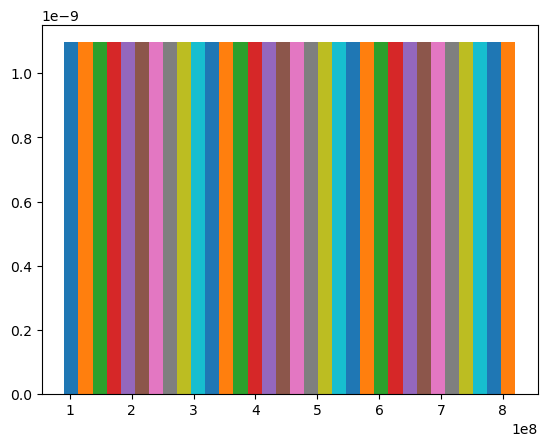

In [20]:
plt.hist(kk,bins=1,density=True,alpha=1)
plt.show()

/Users/pritikumari/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)
/Users/pritikumari/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)
/Users/pritikumari/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)
/Users/pritikumari/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)
/Users/pritikumari/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)
/Users/pritikumari/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:118: UserWarning: The 

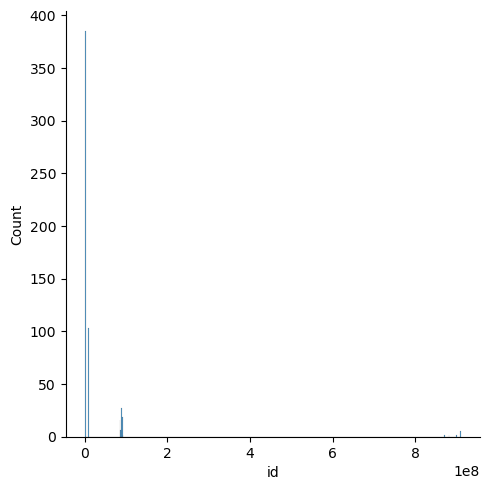

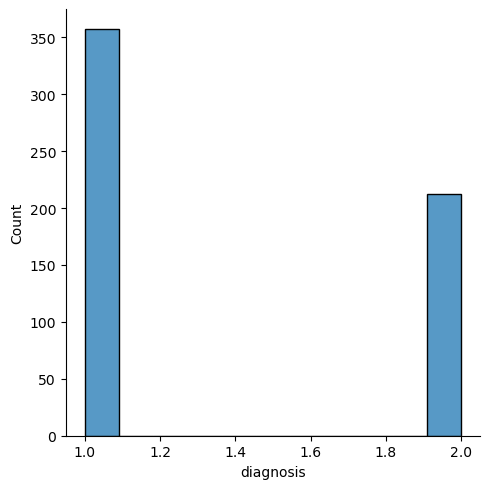

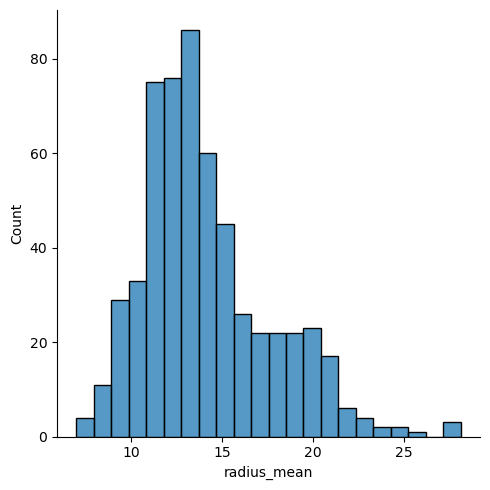

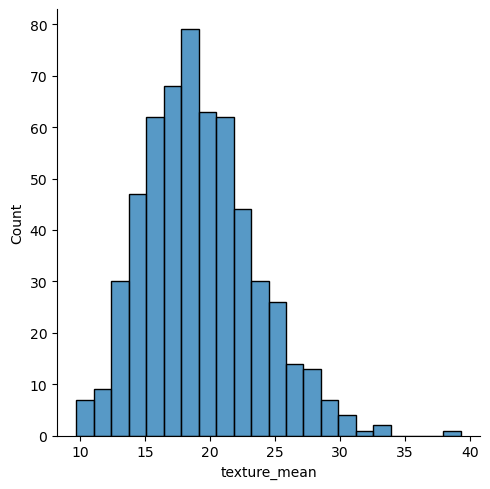

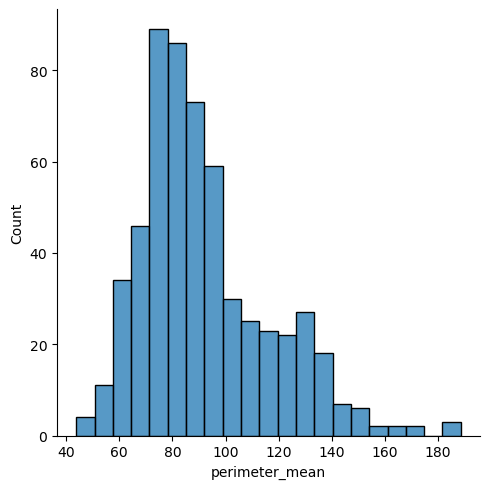

...

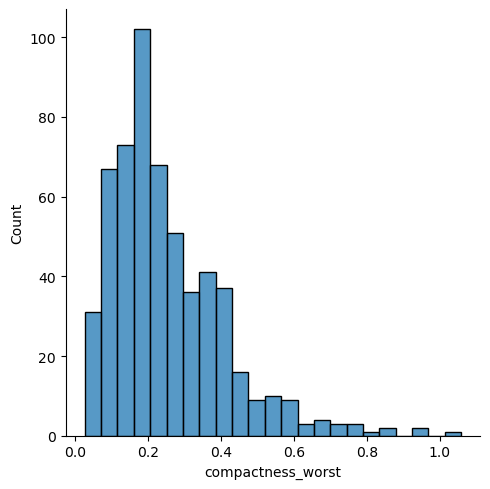

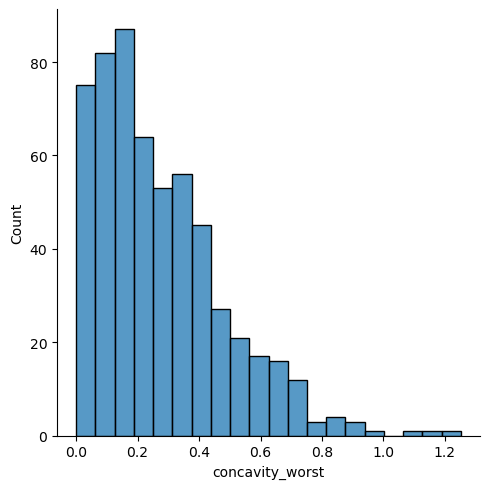

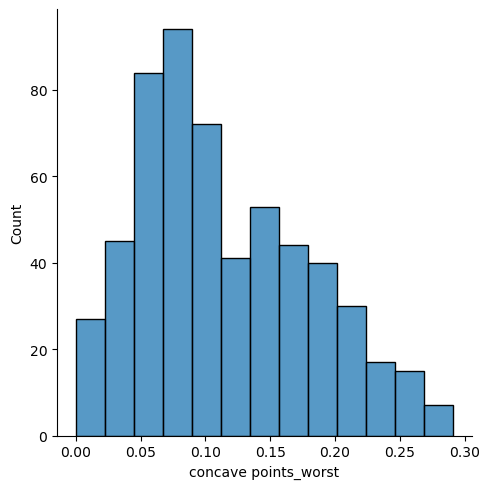

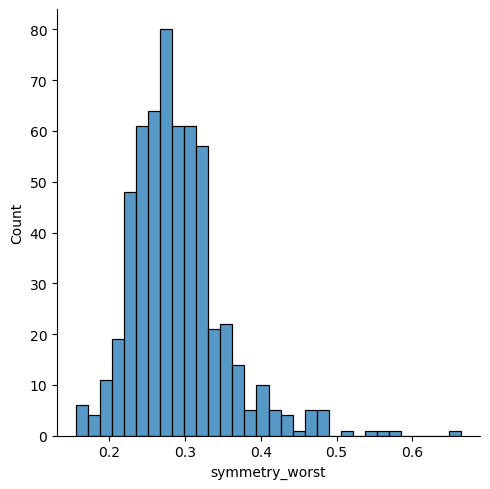

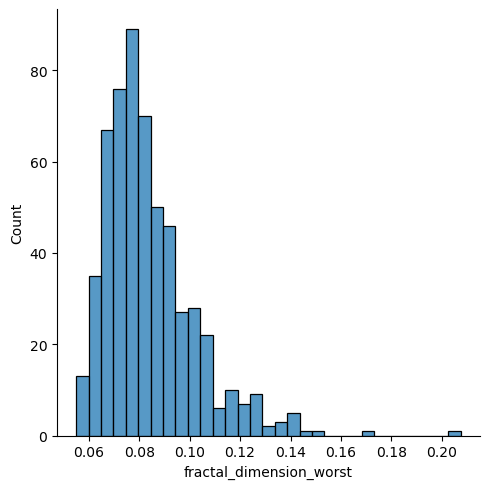

In [21]:
for columns in kk:
 sns.displot(x=columns,data=kk)

In [22]:
sns.pairplot(kk)

/Users/pritikumari/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


<Axes: xlabel='diagnosis'>

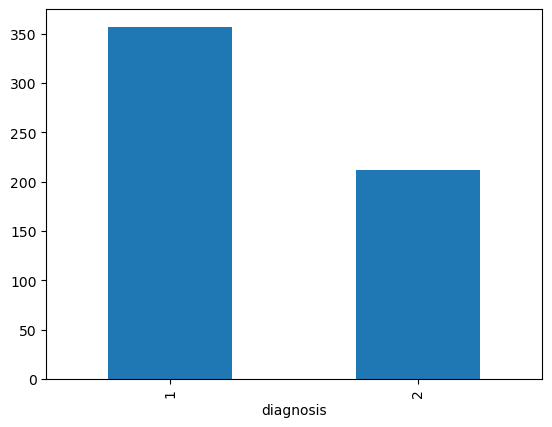

In [25]:
kk['diagnosis'].value_counts().plot.bar()

<Axes: xlabel='diagnosis'>

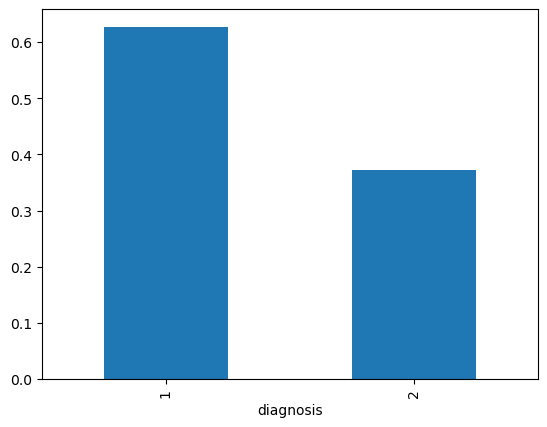

In [24]:
kk['diagnosis'].value_counts(normalize='True').plot.bar()

<Axes: xlabel='diagnosis', ylabel='radius_mean'>

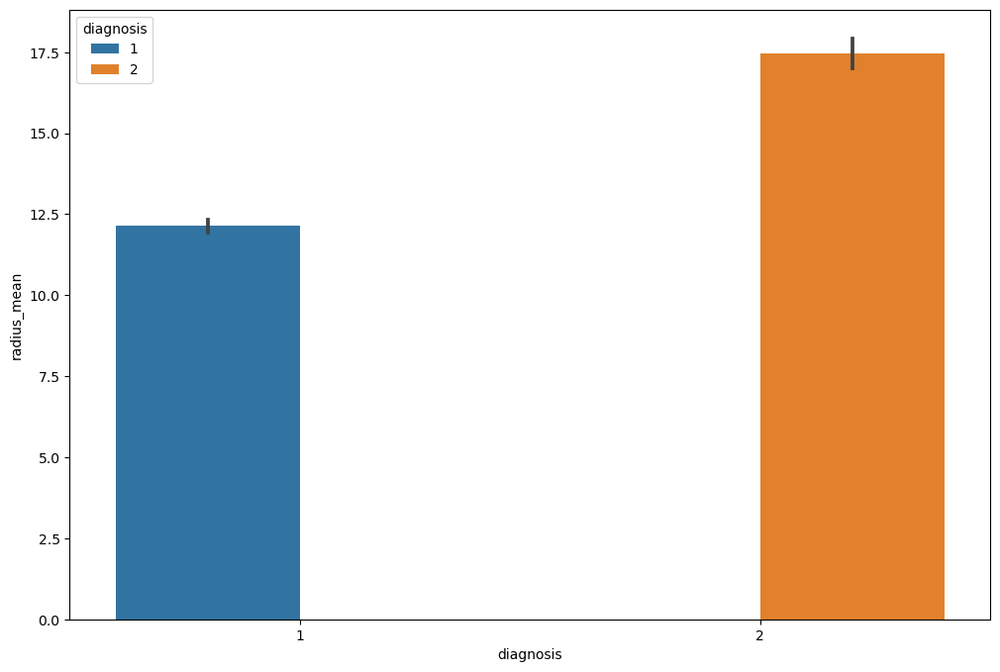

In [28]:
plt.figure(figsize=(12,8))
sns.barplot(data=kk,y='radius_mean',x='diagnosis',hue='diagnosis')

<Axes: xlabel='concavity_mean', ylabel='count'>

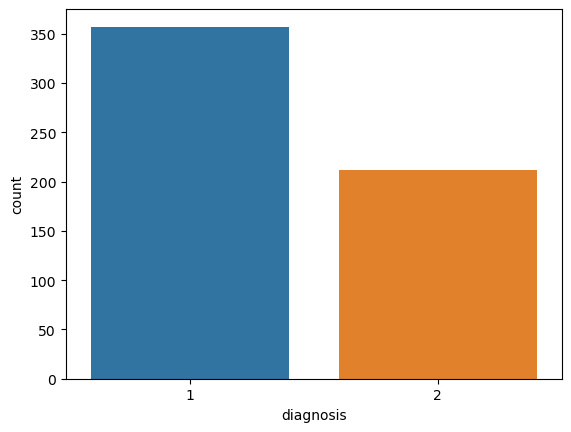

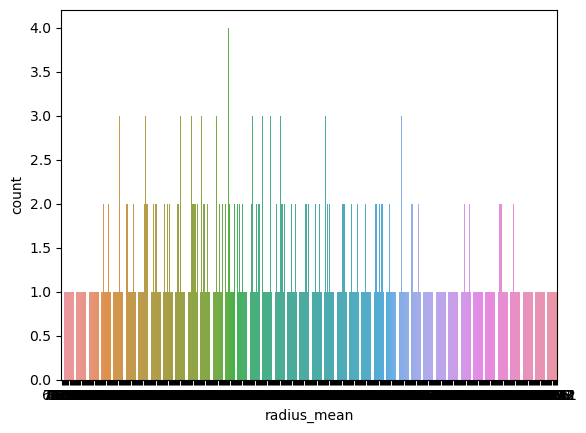

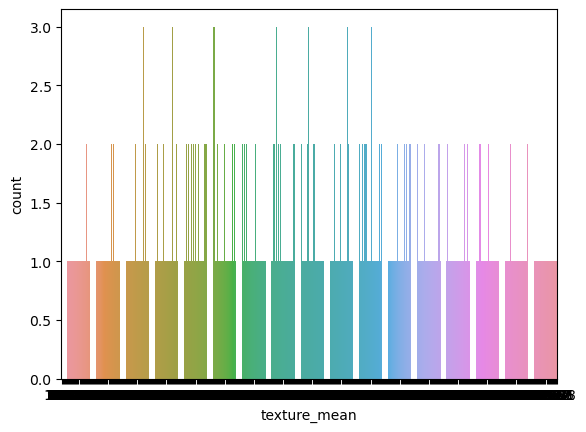

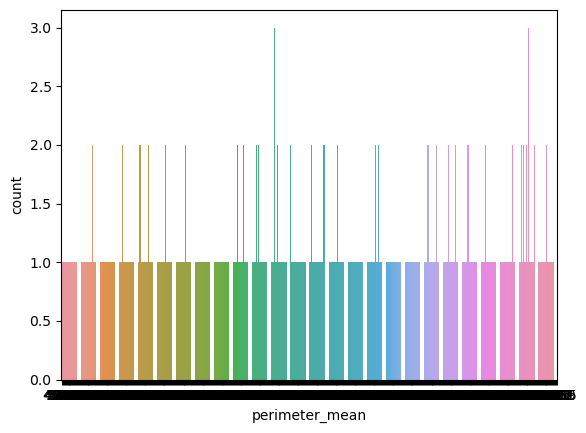

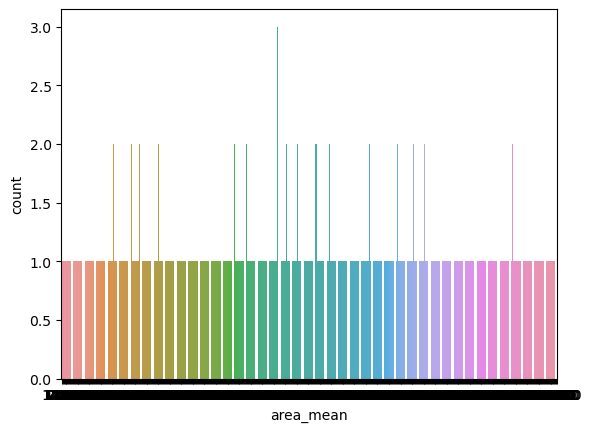

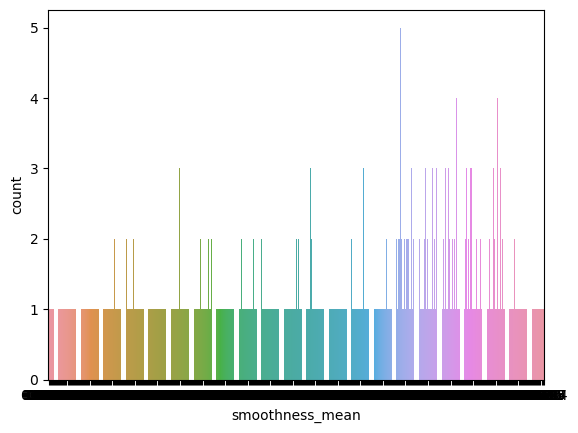

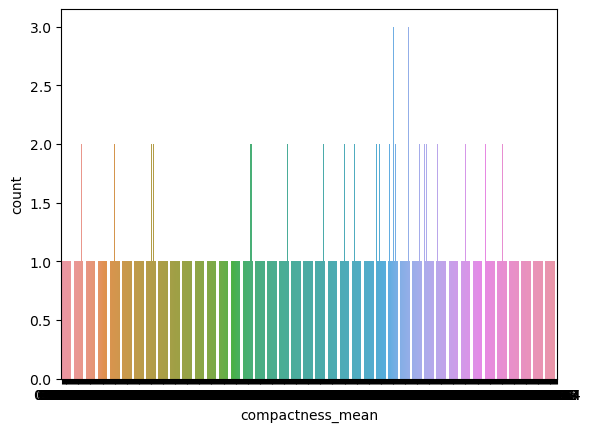

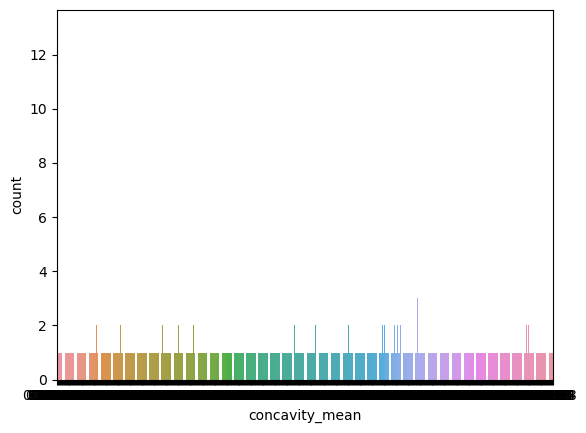

In [32]:
plt.figure(1)
plt.subplot(111)
sns.countplot(x='diagnosis',data=kk)
plt.figure(2)
plt.subplot(111)
sns.countplot(x='radius_mean',data=kk)
plt.figure(3)
plt.subplot(111)
sns.countplot(x='texture_mean',data=kk)
plt.figure(4)
plt.subplot(111)
sns.countplot(x='perimeter_mean',data=kk)
plt.figure(5)
plt.subplot(111)
sns.countplot(x='area_mean',data=kk)
plt.figure(6)
plt.subplot(111)
sns.countplot(x='smoothness_mean',data=kk)
plt.figure(7)
plt.subplot(111)
sns.countplot(x='compactness_mean',data=kk)
plt.figure(8)
plt.subplot(111)
sns.countplot(x='concavity_mean',data=kk)

In [31]:
kk.dtypes

diagnosis                    int64
radius_mean                float64
texture_mean               float64
perimeter_mean             float64
area_mean                  float64
smoothness_mean            float64
compactness_mean           float64
concavity_mean             float64
concave points_mean        float64
symmetry_mean              float64
fractal_dimension_mean     float64
radius_se                  float64
texture_se                 float64
perimeter_se               float64
area_se                    float64
smoothness_se              float64
compactness_se             float64
concavity_se               float64
concave points_se          float64
symmetry_se                float64
fractal_dimension_se       float64
radius_worst               float64
texture_worst              float64
perimeter_worst            float64
area_worst                 float64
smoothness_worst           float64
compactness_worst          float64
concavity_worst            float64
concave points_worst

<Axes: xlabel='diagnosis', ylabel='fractal_dimension_worst'>

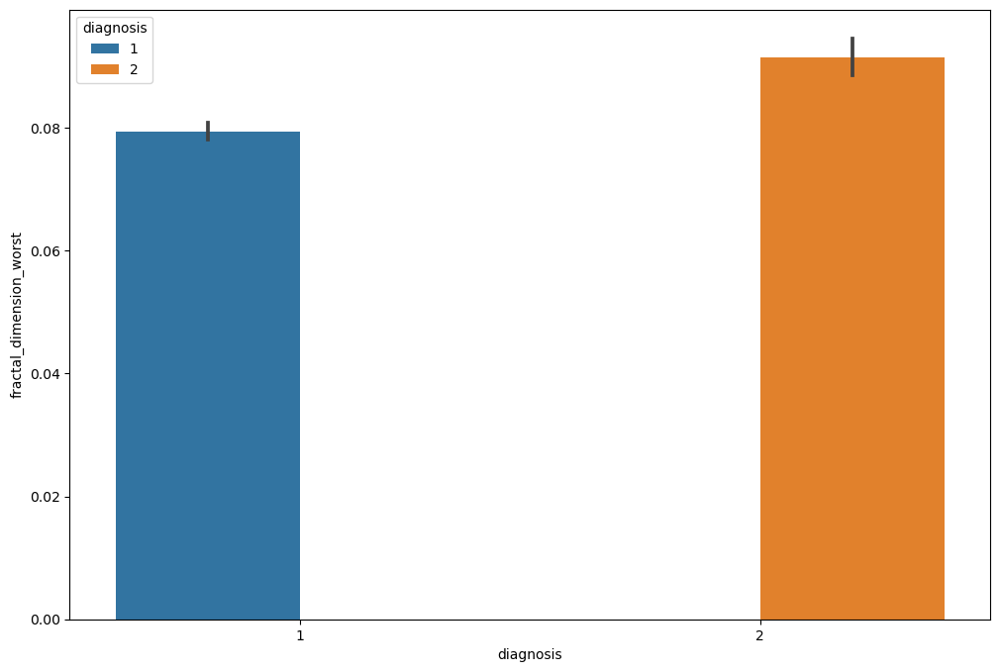

In [33]:
plt.figure(figsize=(12,8))
sns.barplot(data=kk,y='fractal_dimension_worst',x='diagnosis',hue='diagnosis')

<Axes: xlabel='diagnosis', ylabel='texture_mean'>

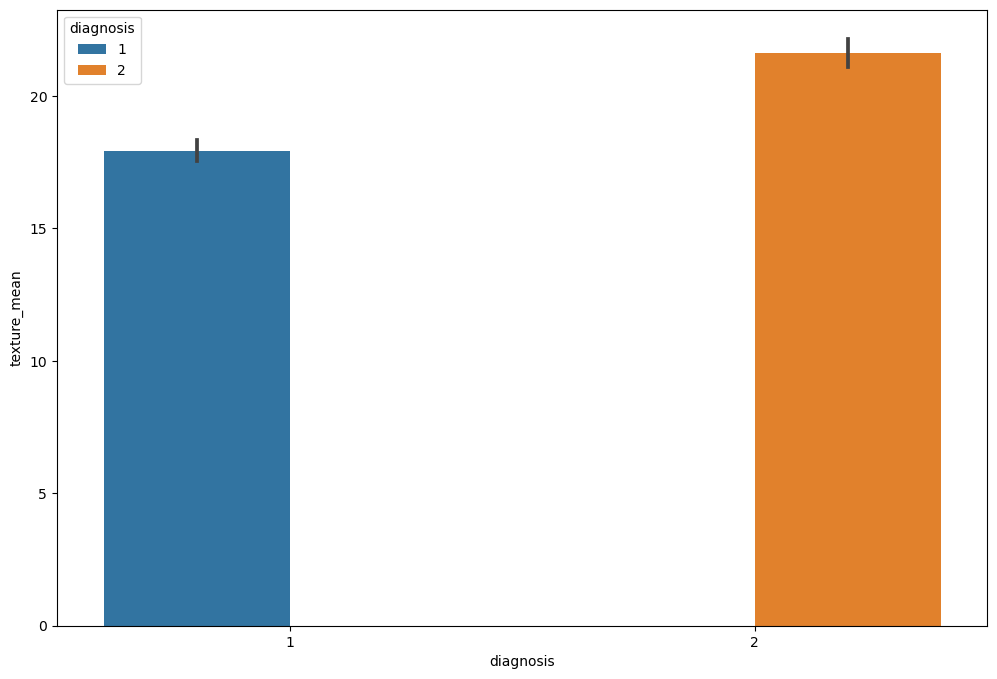

In [34]:
plt.figure(figsize=(12,8))
sns.barplot(data=kk,y='texture_mean',x='diagnosis',hue='diagnosis')

<Axes: xlabel='diagnosis', ylabel='perimeter_mean'>

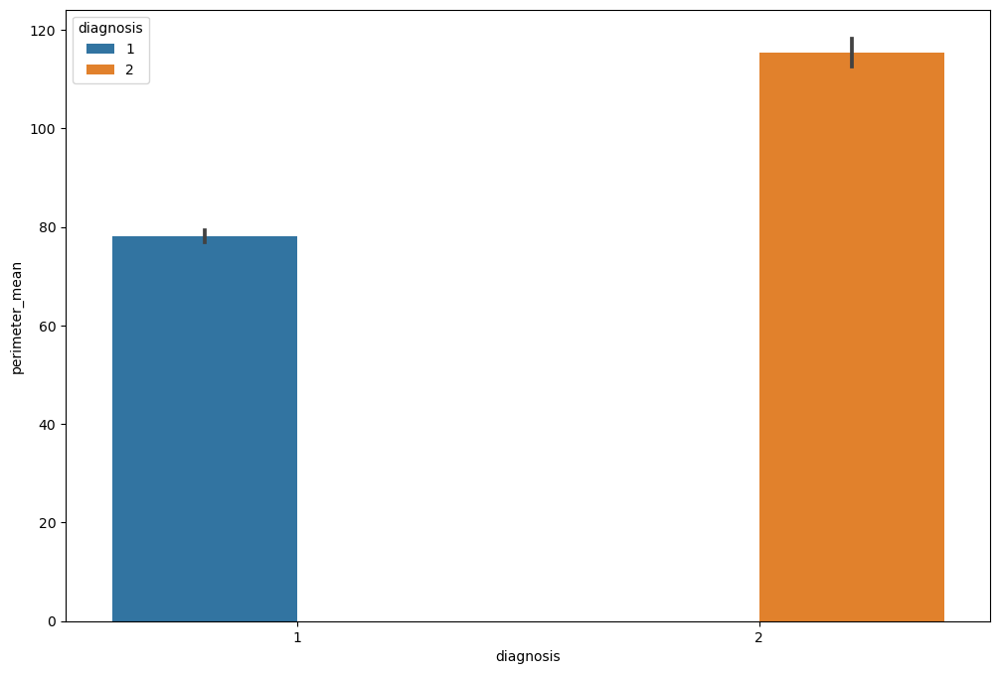

In [35]:
plt.figure(figsize=(12,8))
sns.barplot(data=kk,y='perimeter_mean',x='diagnosis',hue='diagnosis')

<Axes: xlabel='diagnosis', ylabel='area_se'>

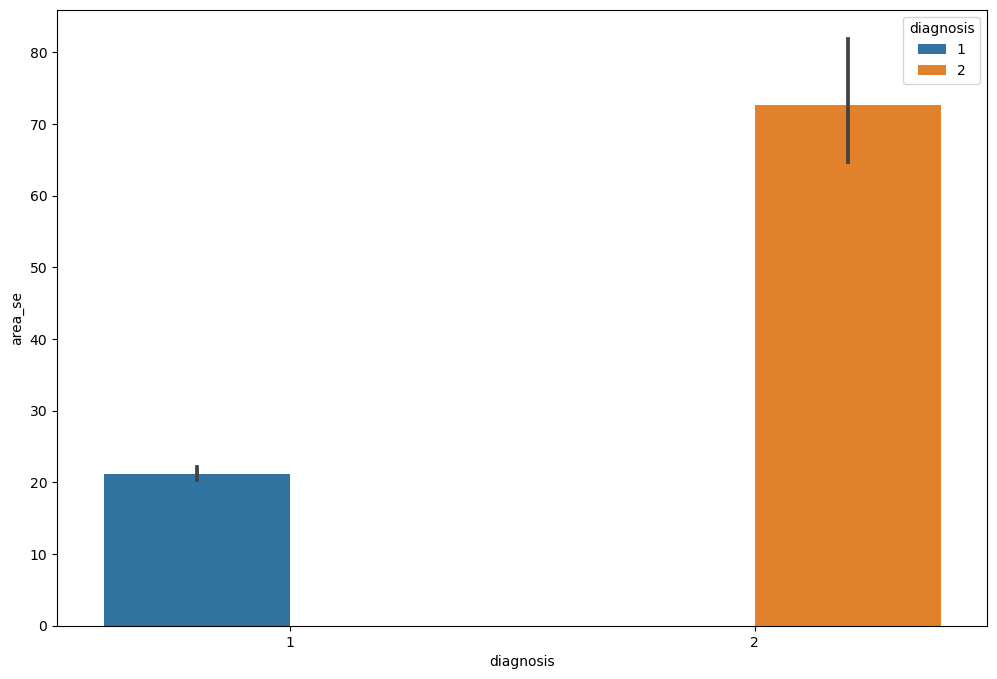

In [36]:
plt.figure(figsize=(12,8))
sns.barplot(data=kk,y='area_se',x='diagnosis',hue='diagnosis')

<Axes: xlabel='diagnosis', ylabel='smoothness_se'>

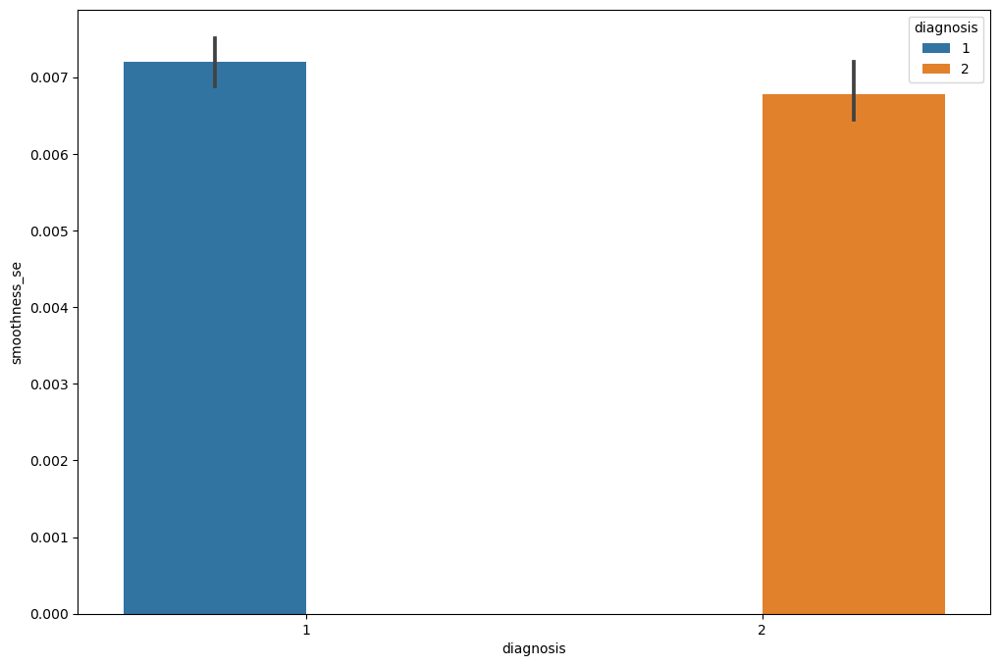

In [37]:
plt.figure(figsize=(12,8))
sns.barplot(data=kk,y='smoothness_se',x='diagnosis',hue='diagnosis')

<Axes: xlabel='diagnosis', ylabel='compactness_se'>

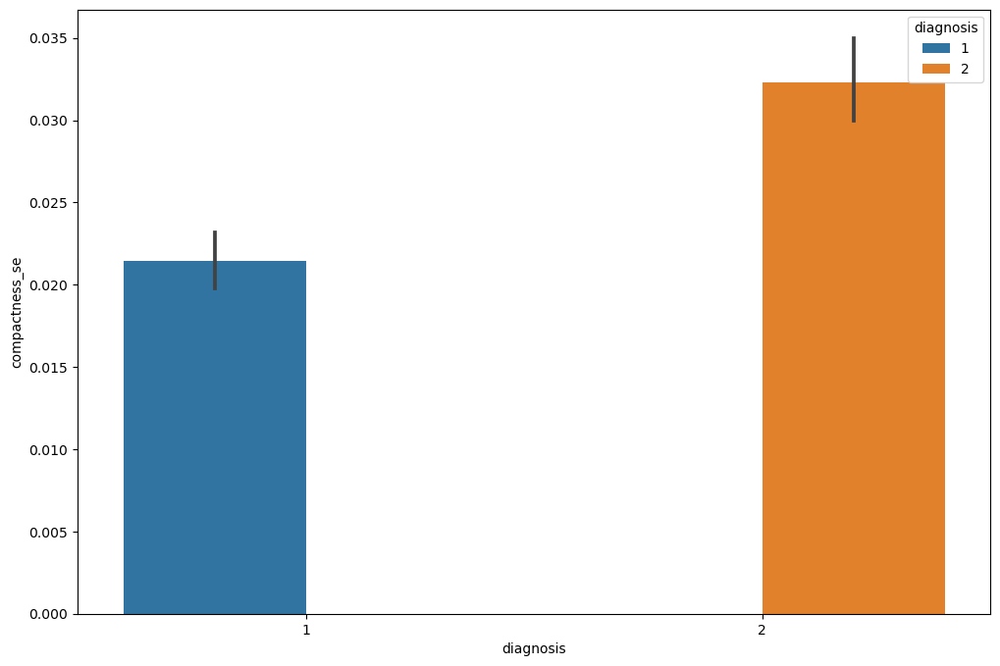

In [38]:
plt.figure(figsize=(12,8))
sns.barplot(data=kk,y='compactness_se',x='diagnosis',hue='diagnosis')

<Axes: xlabel='diagnosis', ylabel='concavity_se'>

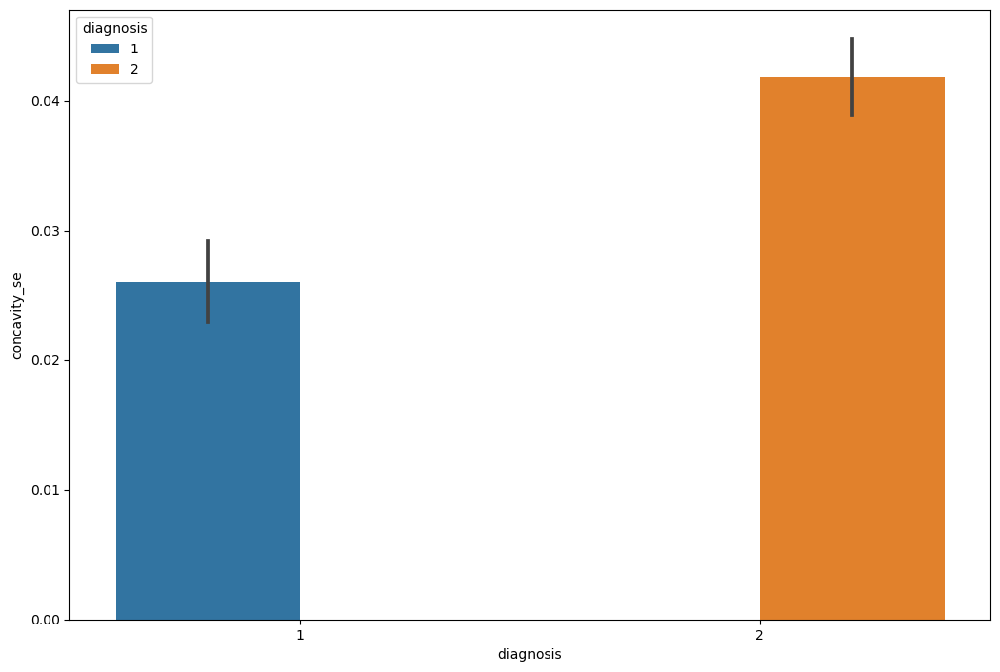

In [39]:
plt.figure(figsize=(12,8))
sns.barplot(data=kk,y='concavity_se',x='diagnosis',hue='diagnosis')

<Axes: xlabel='diagnosis', ylabel='concave points_se'>

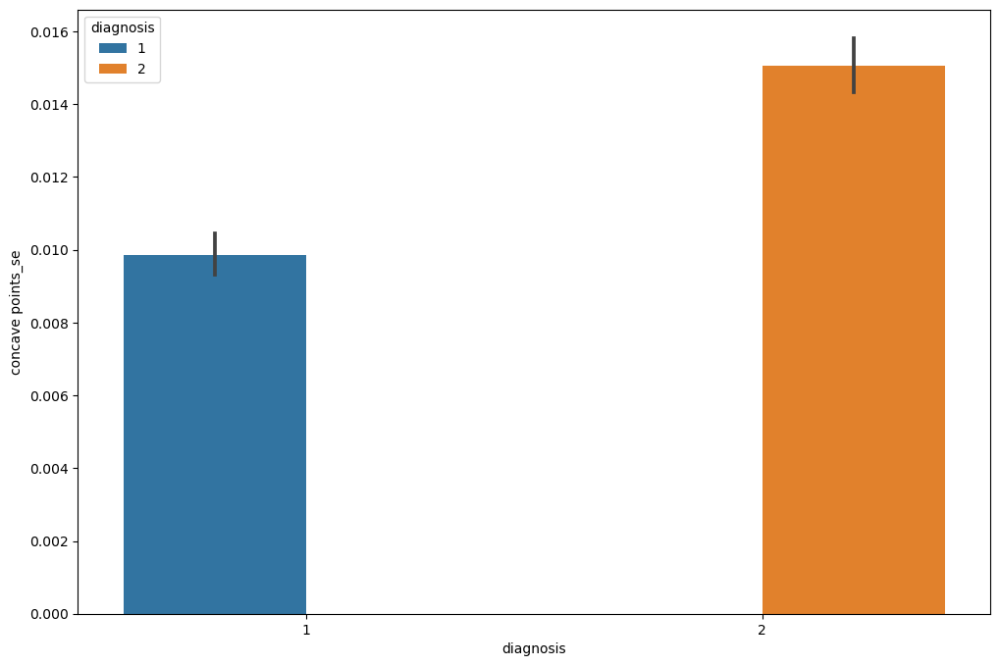

In [40]:
plt.figure(figsize=(12,8))
sns.barplot(data=kk,y='concave points_se',x='diagnosis',hue='diagnosis')

<Axes: xlabel='diagnosis', ylabel='symmetry_se'>

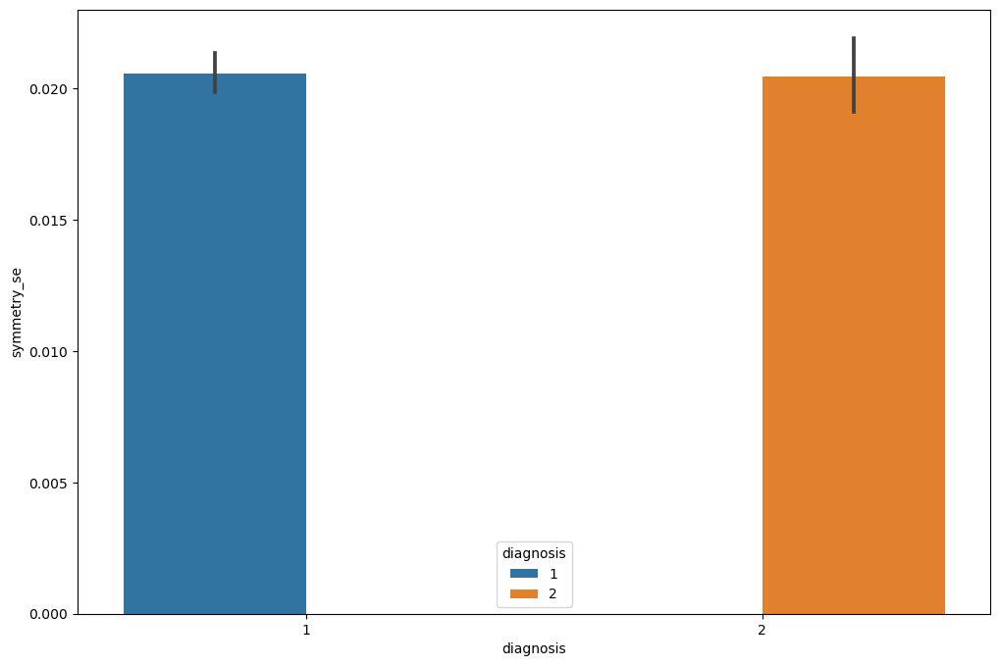

In [41]:
plt.figure(figsize=(12,8))
sns.barplot(data=kk,y='symmetry_se',x='diagnosis',hue='diagnosis')

<Axes: xlabel='diagnosis', ylabel='fractal_dimension_se'>

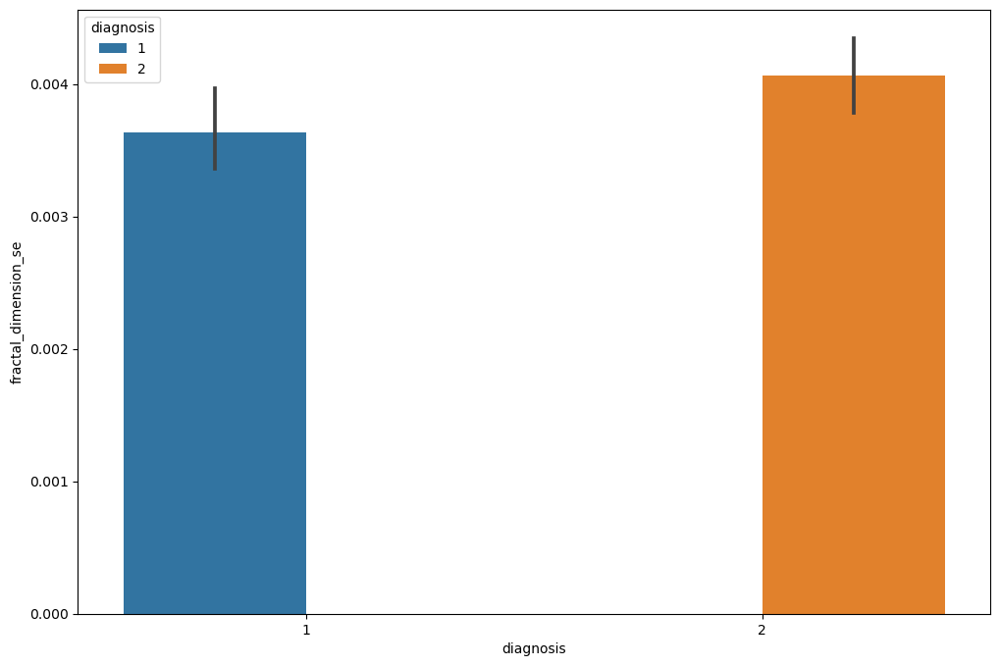

In [42]:
plt.figure(figsize=(12,8))
sns.barplot(data=kk,y='fractal_dimension_se',x='diagnosis',hue='diagnosis')

<Axes: xlabel='diagnosis', ylabel='radius_worst'>

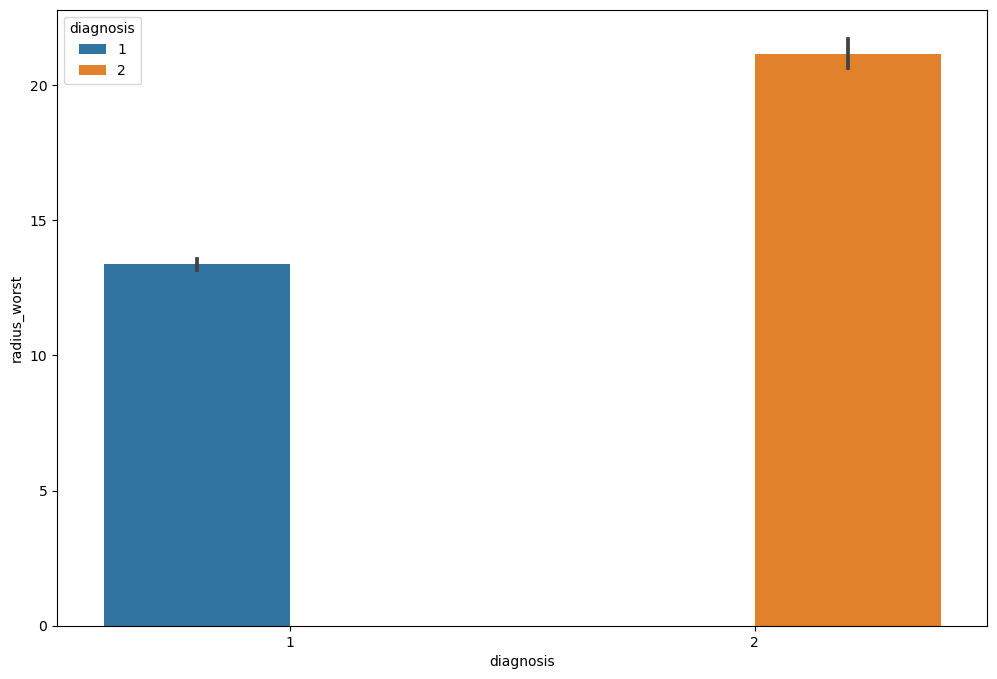

In [43]:
plt.figure(figsize=(12,8))
sns.barplot(data=kk,y='radius_worst',x='diagnosis',hue='diagnosis')

<Axes: xlabel='diagnosis', ylabel='texture_worst'>

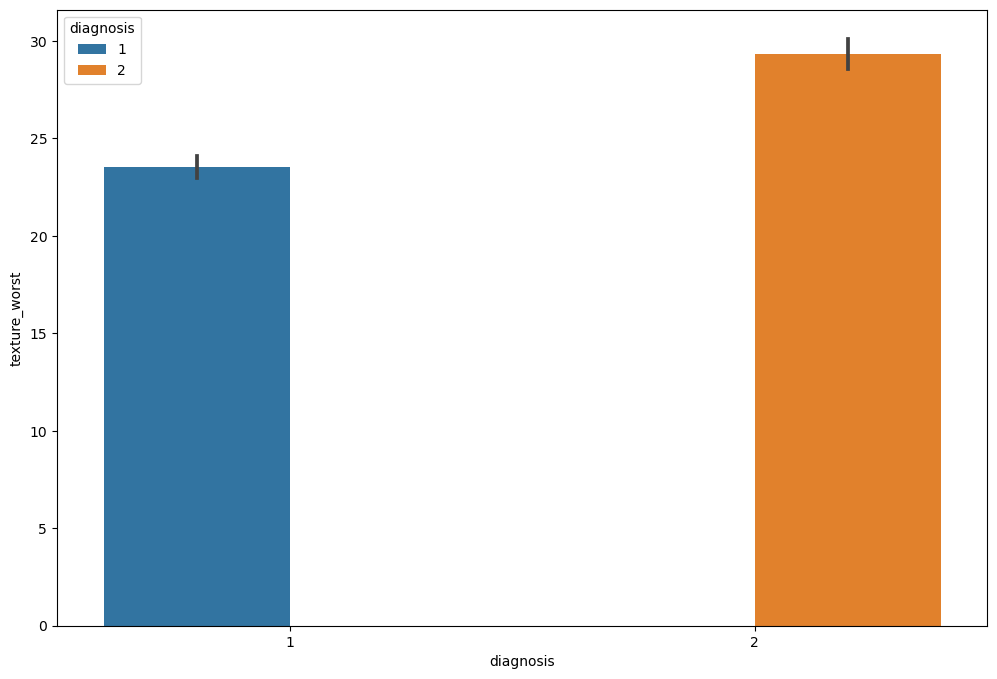

In [44]:
plt.figure(figsize=(12,8))
sns.barplot(data=kk,y='texture_worst',x='diagnosis',hue='diagnosis')

<Axes: xlabel='diagnosis', ylabel='perimeter_worst'>

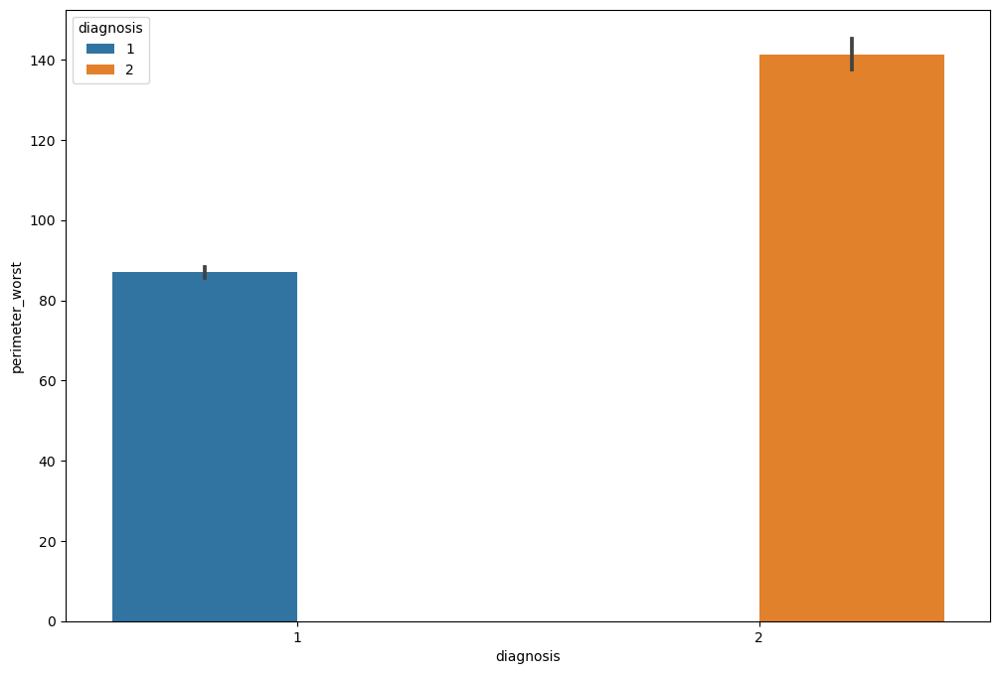

In [45]:
plt.figure(figsize=(12,8))
sns.barplot(data=kk,y='perimeter_worst',x='diagnosis',hue='diagnosis')

<Axes: xlabel='diagnosis', ylabel='area_worst'>

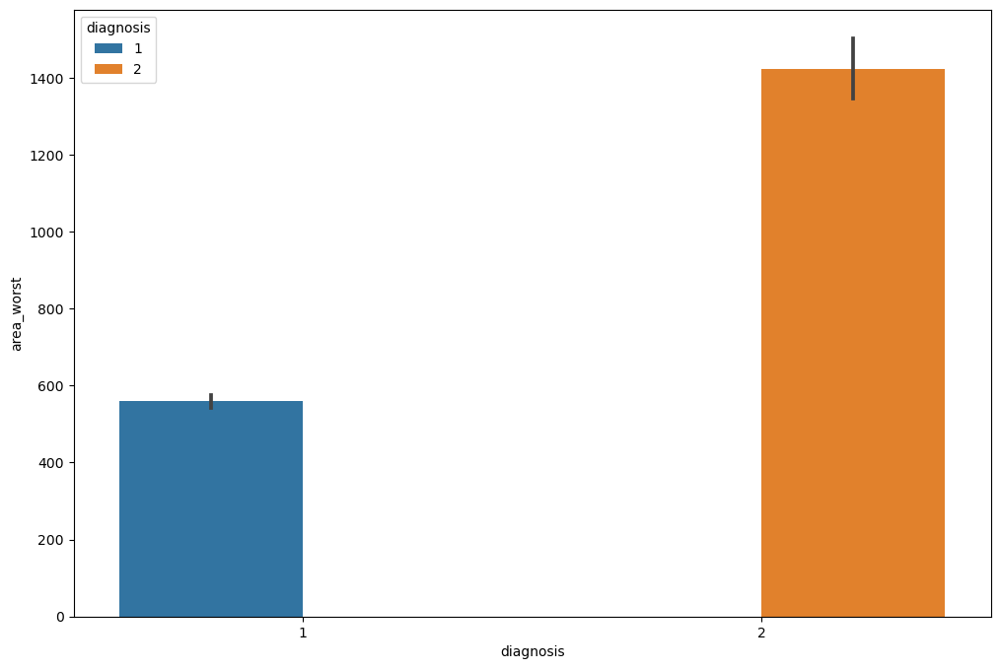

In [46]:
plt.figure(figsize=(12,8))
sns.barplot(data=kk,y='area_worst',x='diagnosis',hue='diagnosis')

<Axes: xlabel='diagnosis', ylabel='symmetry_worst'>

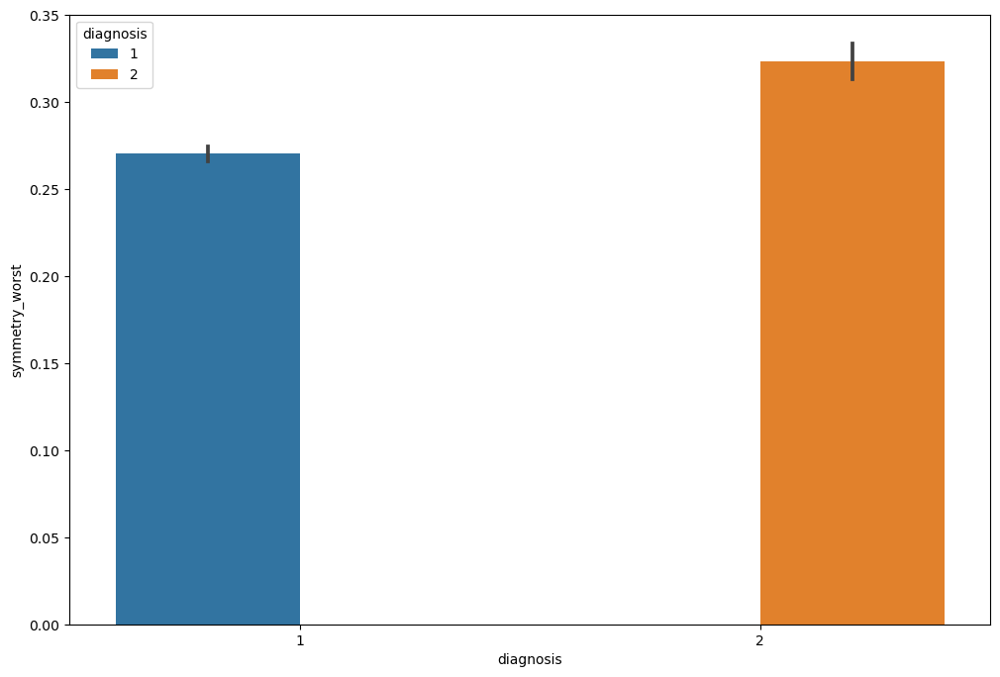

In [47]:
plt.figure(figsize=(12,8))
sns.barplot(data=kk,y='symmetry_worst',x='diagnosis',hue='diagnosis')

<Axes: xlabel='diagnosis', ylabel='smoothness_worst'>

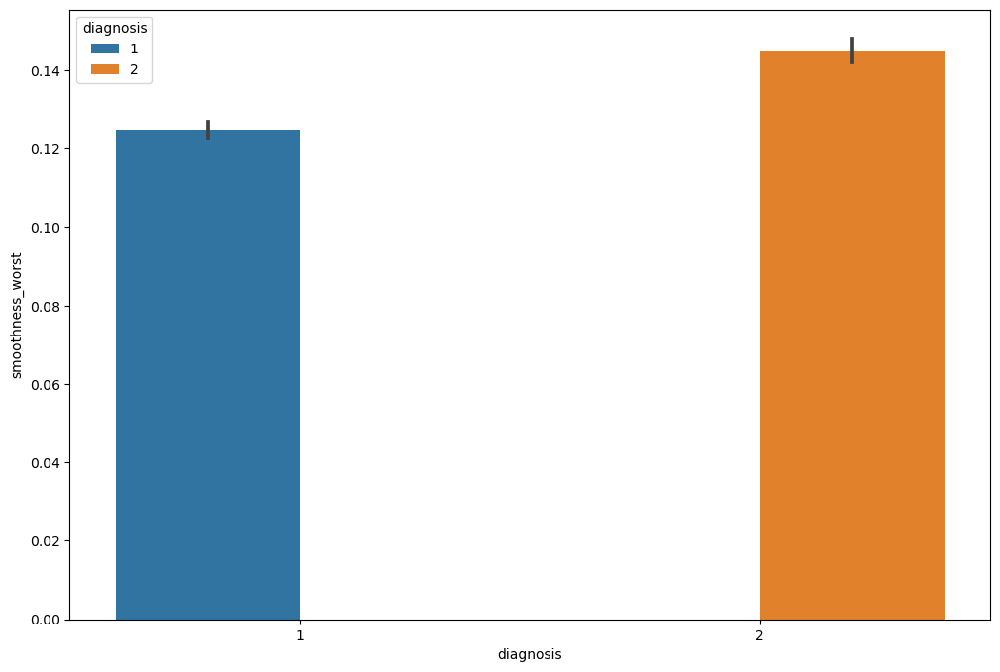

In [48]:
plt.figure(figsize=(12,8))
sns.barplot(data=kk,y='smoothness_worst',x='diagnosis',hue='diagnosis')

<Axes: xlabel='diagnosis', ylabel='compactness_worst'>

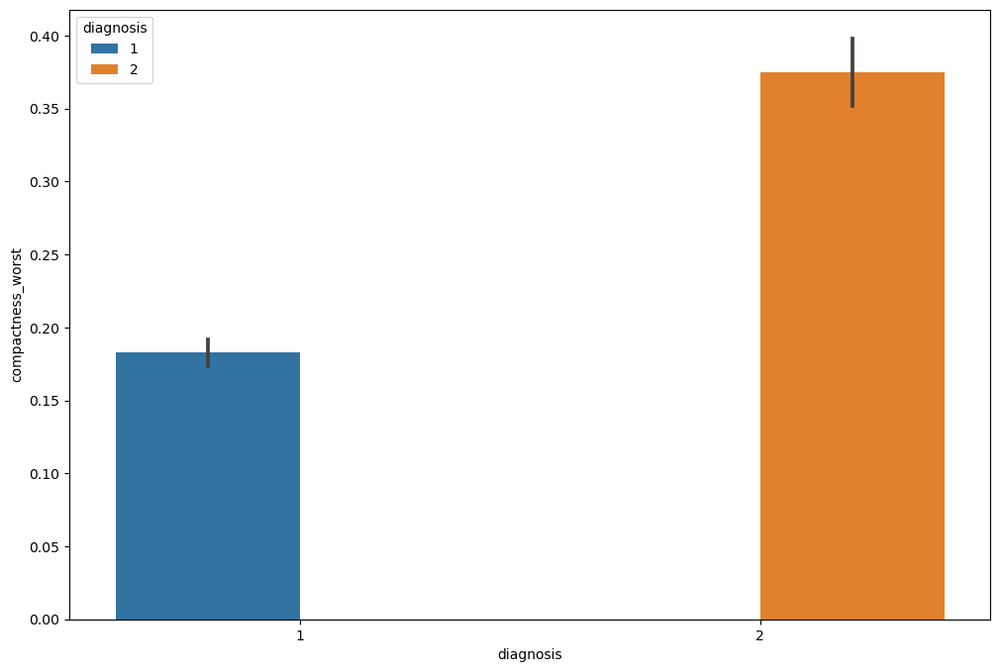

In [49]:
plt.figure(figsize=(12,8))
sns.barplot(data=kk,y='compactness_worst',x='diagnosis',hue='diagnosis')

<Axes: xlabel='diagnosis', ylabel='concavity_worst'>

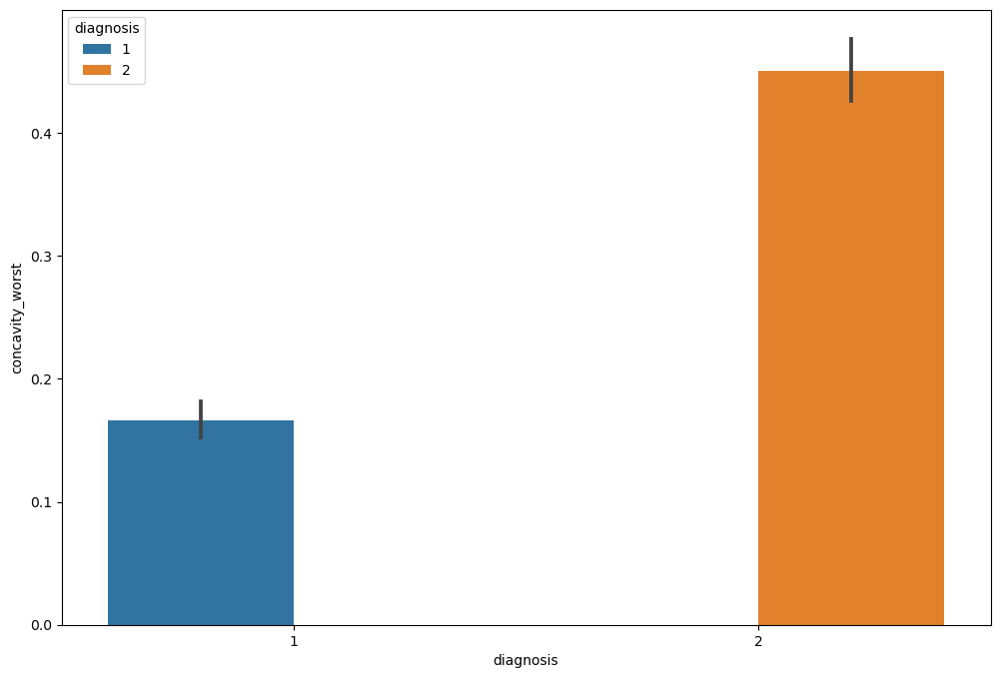

In [50]:
plt.figure(figsize=(12,8))
sns.barplot(data=kk,y='concavity_worst',x='diagnosis',hue='diagnosis')

<Axes: xlabel='diagnosis', ylabel='concave points_worst'>

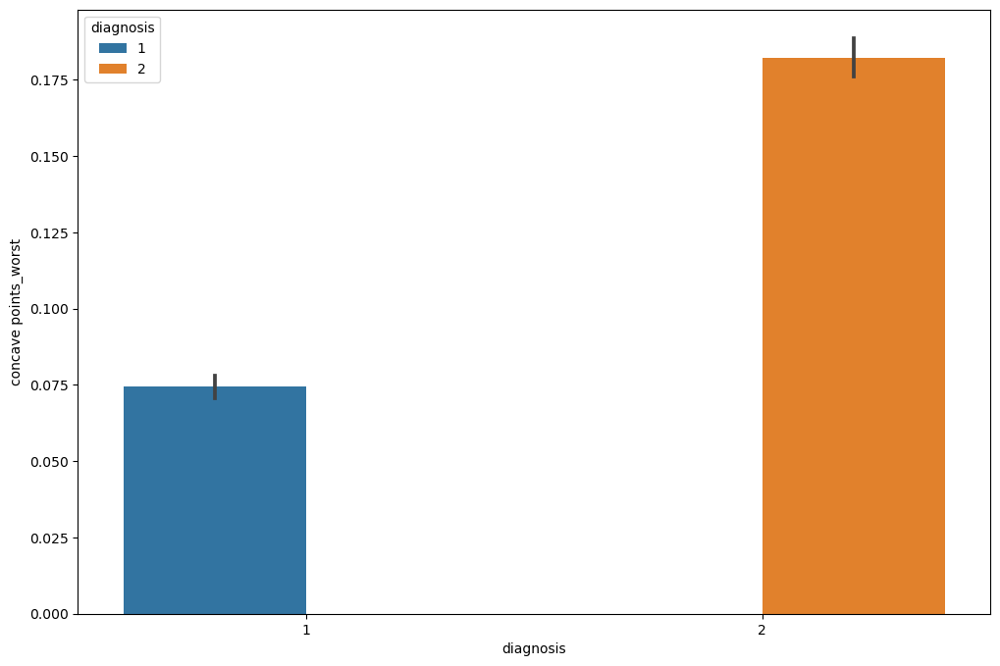

In [51]:
plt.figure(figsize=(12,8))
sns.barplot(data=kk,y='concave points_worst',x='diagnosis',hue='diagnosis')

<Axes: >

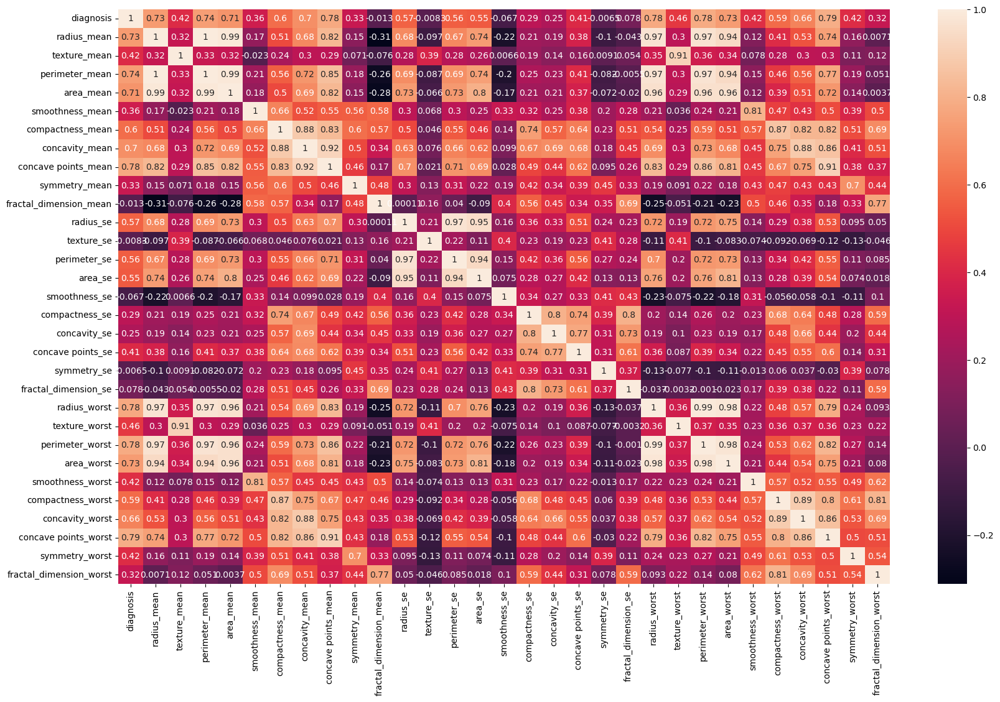

In [54]:
plt.figure(figsize=(20,12))
sns.heatmap(kk.corr(),annot=True)

In [56]:
X=kk.drop(['diagnosis'],axis=1)

In [57]:
Y=kk['diagnosis']

In [58]:
X

,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,fractal_dimension_mean,...,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
0,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.30010,0.14710,0.2419,0.07871,...,25.380,17.33,184.60,2019.0,0.16220,0.66560,0.7119,0.2654,0.4601,0.11890
1,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.08690,0.07017,0.1812,0.05667,...,24.990,23.41,158.80,1956.0,0.12380,0.18660,0.2416,0.1860,0.2750,0.08902
2,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.19740,0.12790,0.2069,0.05999,...,23.570,25.53,152.50,1709.0,0.14440,0.42450,0.4504,0.2430,0.3613,0.08758
3,11.42,20.38,77.58,386.1,0.14250,0.28390,0.24140,0.10520,0.2597,0.09744,...,14.910,26.50,98.87,567.7,0.20980,0.86630,0.6869,0.2575,0.6638,0.17300
4,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.19800,0.10430,0.1809,0.05883,...,22.540,16.67,152.20,1575.0,0.13740,0.20500,0.4000,0.1625,0.2364,0.07678
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
564,21.56,22.39,142.00,1479.0,0.11100,0.11590,0.24390,0.13890,0.1726,0.05623,...,25.450,26.40,166.10,2027.0,0.14100,0.21130,0.4107,0.2216,0.2060,0.07115
565,20.13,28.25,131.20,1261.0,0.09780,0.10340,0.14400,0.09791,0.1752,0.05533,...,23.690,38.25,155.00,1731.0,0.11660,0.19220,0.3215,0.1628,0.2572,0.06637
566,16.60,28.08,108.30,858.1,0.08455,0.10230,0.09251,0.05302,0.1590,0.05648,...,18.980,34.12,126.70,1124.0,0.11390,0.30940,0.3403,0.1418,0.2218,0.07820
567,20.60,29.33,140.10,1265.0,0.11780,0.27700,0.35140,0.15200,0.2397,0.07016,...,25.740,39.42,184.60,1821.0,0.16500,0.86810,0.9387,0.2650,0.4087,0.12400


In [59]:
Y

0      2
1      2
2      2
3      2
4      2
      ..
564    2
565    2
566    2
567    2
568    1
Name: diagnosis, Length: 569, dtype: int64

# Standardization and Normalization

In [60]:
from sklearn.preprocessing import MinMaxScaler
scalers=MinMaxScaler()
Xs=scalers.fit_transform(X)

In [61]:
Xs

array([[0.52103744, 0.0226581 , 0.54598853, ..., 0.91202749, 0.59846245,
        0.41886396],
       [0.64314449, 0.27257355, 0.61578329, ..., 0.63917526, 0.23358959,
        0.22287813],
       [0.60149557, 0.3902604 , 0.59574321, ..., 0.83505155, 0.40370589,
        0.21343303],
       ...,
       [0.45525108, 0.62123774, 0.44578813, ..., 0.48728522, 0.12872068,
        0.1519087 ],
       [0.64456434, 0.66351031, 0.66553797, ..., 0.91065292, 0.49714173,
        0.45231536],
       [0.03686876, 0.50152181, 0.02853984, ..., 0.        , 0.25744136,
        0.10068215]])

In [69]:
X_train,X_test,Y_train,Y_test=train_test_split(Xs,Y,test_size=0.4,random_state=42,stratify=Y)

In [70]:
X.shape,X_train.shape,X_test.shape

((569, 30), (341, 30), (228, 30))

In [71]:
Y.shape,Y_train.shape,Y_test.shape

((569,), (341,), (228,))

Accuracy Comparison :-

Linear Discriminant Analysis:
trainAccuracy: 0.9677
testingAccuracy: 0.9693


Logistic Regression:
trainAccuracy: 0.9677
testingAccuracy: 0.9605


Naive Bayes:
trainAccuracy: 0.9531
testingAccuracy: 0.9298


Support Vector Machine:
trainAccuracy: 0.9853
testingAccuracy: 0.9825


K-Nearest Neighbors:
trainAccuracy: 0.9795
testingAccuracy: 0.9693


Decision Tree:
trainAccuracy: 1.0000
testingAccuracy: 0.9430


Random Forest:
trainAccuracy: 1.0000
testingAccuracy: 0.9693


Bagging:
trainAccuracy: 1.0000
testingAccuracy: 0.9430


AdaBoost:
trainAccuracy: 1.0000
testingAccuracy: 0.9737




/Users/pritikumari/anaconda3/lib/python3.11/site-packages/sklearn/ensemble/_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(


Gradient Boosting:
trainAccuracy: 1.0000
testingAccuracy: 0.9605


Extra Trees:
trainAccuracy: 1.0000
testingAccuracy: 0.9211




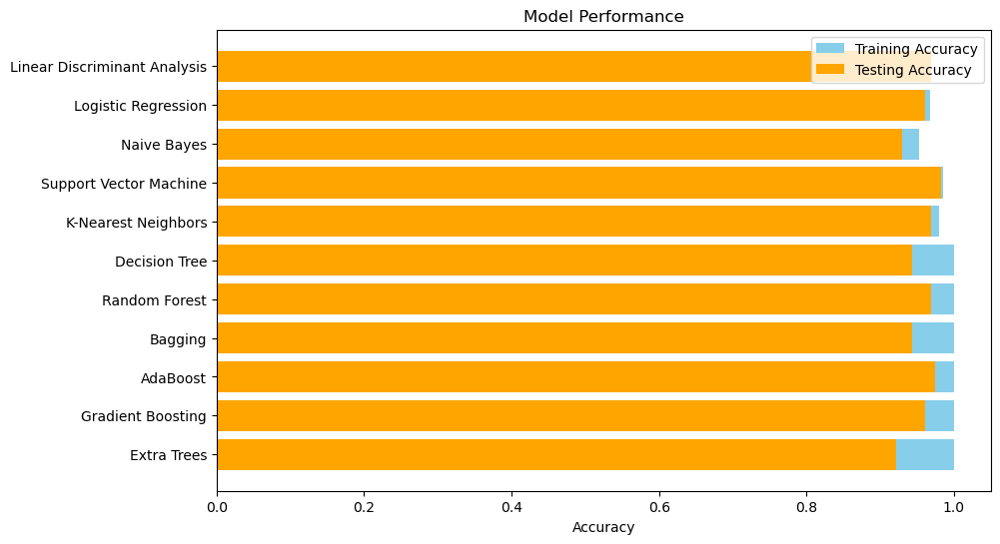

In [72]:
#USE DIFFERENT DIFFERNT MODEL TO CHECK THE ACCURACY(TRAINING AND TESTING ACCURACY).
#I WILL USE ONLY THOSE MODEL FOR FURTHER STEP(TRAINING STAGE)WHICH GIVE PROPER VALUE OF ACCURACY
#BECAUSE THE MODEL WHICH GIVE PROPER ACCURACY CAN PREDICT THE RESULT IN BETTER WAY
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.linear_model import LogisticRegression
from sklearn.naive_bayes import GaussianNB
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.tree import ExtraTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import BaggingClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.ensemble import AdaBoostClassifier
results=[]
names=[]
# create instances of all models
models = {
    'Linear Discriminant Analysis': LinearDiscriminantAnalysis(),
    'Logistic Regression': LogisticRegression(),
    'Naive Bayes': GaussianNB(),
    'Support Vector Machine': SVC(),
    'K-Nearest Neighbors': KNeighborsClassifier(),
    'Decision Tree': DecisionTreeClassifier(),
    'Random Forest': RandomForestClassifier(),
    'Bagging': BaggingClassifier(),
    'AdaBoost': AdaBoostClassifier(),
    'Gradient Boosting': GradientBoostingClassifier(),
    'Extra Trees': ExtraTreeClassifier(),
}
from sklearn.metrics import accuracy_score

# Training accuracies
train_accuracies = []
test_accuracies = []
print('Accuracy Comparison :-\n')
for name, model in models.items():
    model.fit(X_train, Y_train)
    # Training accuracy
    X_train_prediction = model.predict(X_train)
    train_accuracy = accuracy_score(X_train_prediction, Y_train)
    train_accuracies.append(train_accuracy)
    
    # Testing accuracy
    y_pred = model.predict(X_test)
    test_accuracy = accuracy_score(Y_test, y_pred)
    test_accuracies.append(test_accuracy)
    print(f'{name}:')
    print(f'trainAccuracy: {train_accuracy:.4f}')
    print(f'testingAccuracy: {test_accuracy:.4f}')
    print('\n')

# Plotting
plt.figure(figsize=(10, 6))
plt.barh(list(models.keys()), train_accuracies, color='skyblue', label='Training Accuracy')
plt.barh(list(models.keys()), test_accuracies, color='orange', label='Testing Accuracy')
plt.xlabel('Accuracy')
plt.title('Model Performance')
plt.legend()
plt.gca().invert_yaxis()  # Invert y-axis to have the model names at the top
plt.show()

# print("TRAINING ACCURACY:")
# for name, model in models.items():
#     model.fit(X_train, Y_train)
#     X_train_prediction = model.predict(X_train)
#     trainacc = accuracy_score( X_train_prediction, Y_train)
#     print(f'{name}:\ntrainAccuracy: {trainacc:.4f}')
# #for testing  data  
# print("TESTING ACCURACY:")
# for name, model in models.items():
#     model.fit(X_train, Y_train)
#     y_pred = model.predict(X_test)
#     testacc = accuracy_score(Y_test, y_pred)
#     print(f'{name}:\ntestingAccuracy: {testacc:.4f}') 

# #Create a DataFrame for plotting
# data = pd.DataFrame({'Model': models,
#                      'Train Accuracy': trainacc,
#                      'Test Accuracy': testacc})

# # Plotting the results using Seaborn
# plt.figure(figsize=(10, 8))
# sns.barplot(data=data.melt(id_vars='Model'), x='value', y='Model', hue='variable', palette='muted', orient='h')
# plt.xlabel('Accuracy')
# plt.title('Model Performance')
# plt.legend(title=None)
# # plt.gca().invert_yaxis()
# plt.xticks(rotation=45, ha='right')
# # Invert y-axis to display the models in descending order
# plt.show()

In [74]:
model=SVC()

In [75]:
bca=model.fit(X_train,Y_train)

In [80]:
X_train_pred=bca.predict(X_train)
training_accuracy=accuracy_score(X_train_pred,Y_train)
training_accuracy

0.9853372434017595

In [81]:
X_test_pred=bca.predict(X_test)
testing_accuracy=accuracy_score(X_test_pred,Y_test)
testing_accuracy

0.9824561403508771

Text(50.722222222222214, 0.5, 'Actual')

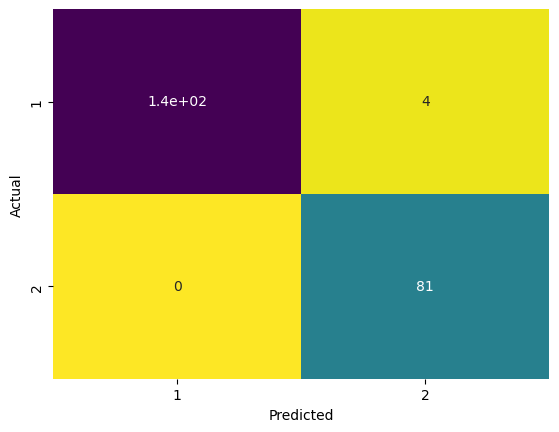

In [84]:
#confusion matrix for that
from sklearn.metrics import confusion_matrix  
cm= confusion_matrix(X_test_pred,Y_test) 
sns.heatmap(cm, annot=True, cbar=False, cmap="viridis_r",
            yticklabels=bca.classes_, xticklabels=bca.classes_)
plt.xlabel('Predicted')
plt.ylabel('Actual')

/var/folders/jp/52lg7vhx5xqc9l1fx_d3rk300000gn/T/ipykernel_11880/210617905.py:1: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  ax=sns.distplot(Y_test,hist=False,color="r",label="Actual value")
/var/folders/jp/52lg7vhx5xqc9l1fx_d3rk300000gn/T/ipykernel_11880/210617905.py:2: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad63

Text(0.5, 1.0, 'SVC ')

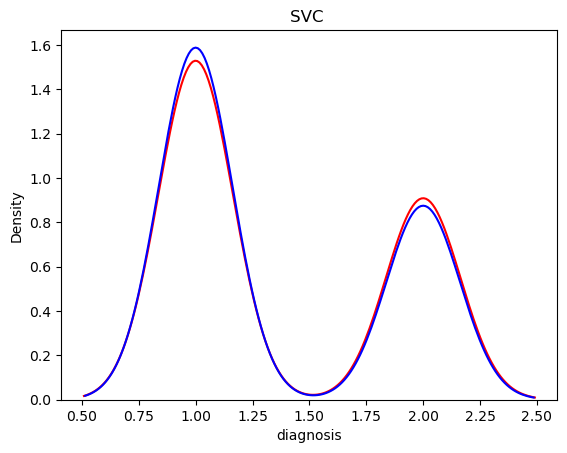

In [86]:
ax=sns.distplot(Y_test,hist=False,color="r",label="Actual value")
sns.distplot(X_test_pred,hist=False,color="b",label="Predicted value",ax=ax)
plt.title('SVC ')

In [87]:
# Print the precision and recall, among other metrics
from sklearn import metrics
print(metrics.classification_report(Y_test, X_test_pred))

              precision    recall  f1-score   support

           1       0.97      1.00      0.99       143
           2       1.00      0.95      0.98        85

    accuracy                           0.98       228
   macro avg       0.99      0.98      0.98       228
weighted avg       0.98      0.98      0.98       228



In [94]:
# making a predictive System for testing the data
# making a predictive System
input_data=X.iloc[19]
#changing the input data to a numpy arrary
input_data_as_numpy_array=np.asarray(input_data)
#reshape the np array s we are predictive for one instance
input_data_reshaped=input_data_as_numpy_array.reshape(1,-1)
#as i already standarize the data so here for input value we once standarize this
std_data=scalers.transform(input_data_reshaped)
print(std_data)
prediction=bca.predict(std_data)#model=SVC
print("target:",prediction)
if(prediction ==1):
    print("Patient is suffering from Benign type ")
elif(prediction==2):
    print("Patient is suffering from malignant")

[[0.31042643 0.15725397 0.30177597 0.17934252 0.40769161 0.18989633
  0.15613871 0.23762425 0.41666667 0.16217355 0.05736013 0.09467822
  0.06130142 0.03130008 0.22942516 0.09273891 0.06027778 0.24910021
  0.16769854 0.04854691 0.25542512 0.19296375 0.24548035 0.12927645
  0.48094829 0.14554045 0.19089457 0.44261168 0.27833629 0.11511216]]
target: [1]
Patient is suffering from Benign type 


/Users/pritikumari/anaconda3/lib/python3.11/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(


In [93]:
Y.head(50)

0     2
1     2
2     2
3     2
4     2
5     2
6     2
7     2
8     2
9     2
10    2
11    2
12    2
13    2
14    2
15    2
16    2
17    2
18    2
19    1
20    1
21    1
22    2
23    2
24    2
25    2
26    2
27    2
28    2
29    2
30    2
31    2
32    2
33    2
34    2
35    2
36    2
37    1
38    2
39    2
40    2
41    2
42    2
43    2
44    2
45    2
46    1
47    2
48    1
49    1
Name: diagnosis, dtype: int64

In [100]:
Benign_type_count=0
malignant_type_count=0
# Iterate over each instance in the dataset
for index, input_data in X.iterrows():
    # Convert input data to a numpy array and reshape it
    input_data_as_numpy_array = np.asarray(input_data).reshape(1, -1)
    # Standardize the input data
    std_data = scalers.transform(input_data_as_numpy_array)
    # Make predictions
    prediction = bca.predict(std_data)
    print("For instance", index)
    print("MadrsScore prediction:", prediction)
    if(prediction ==1):
        print("Patient is suffering from Benign type ")
        Benign_type_count +=1
        
    elif(prediction==2):
        print("Patient is suffering from malignant")
        malignant_type_count +=1
    print("______------------________")
    # Print counts for each condition
print("Number of instances in each condition:")
print("Number of Patient  suffering from Benign type is :",Benign_type_count)
print("Number of Patient  suffering from malignant is :",malignant_type_count)
        


For instance 0
MadrsScore prediction: [2]
Patient is suffering from malignant
______------------________
For instance 1
MadrsScore prediction: [2]
Patient is suffering from malignant
______------------________
For instance 2
MadrsScore prediction: [2]
Patient is suffering from malignant
______------------________
For instance 3
MadrsScore prediction: [2]
Patient is suffering from malignant
______------------________
For instance 4
MadrsScore prediction: [2]
Patient is suffering from malignant
______------------________
For instance 5
MadrsScore prediction: [2]
Patient is suffering from malignant
______------------________
For instance 6
MadrsScore prediction: [2]
Patient is suffering from malignant
______------------________
For instance 7
MadrsScore prediction: [2]
Patient is suffering from malignant
______------------________
For instance 8
MadrsScore prediction: [2]
Patient is suffering from malignant
______------------________
For instance 9
MadrsScore prediction: [2]
Patient is su

/Users/pritikumari/anaconda3/lib/python3.11/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/Users/pritikumari/anaconda3/lib/python3.11/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/Users/pritikumari/anaconda3/lib/python3.11/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/Users/pritikumari/anaconda3/lib/python3.11/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/Users/pritikumari/anaconda3/lib/python3.11/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/Users/pritikumari/anaconda3/lib/py

In [98]:
Y.value_counts()

diagnosis
1    357
2    212
Name: count, dtype: int64

In [104]:
# making a predictive System for testing the data
# making a predictive System
input_data=(17.99,10.338,122.80,10001.0,0.11840,0.27760,0.30010,0.14710,0.2419,0.078710,1.095000,0.905300,8.589000,153.400000,0.006399,0.049040,0.053730,0.015870,0.030030,0.006193,25.380000,17.330000,184.600000,2019.000000,0.162200,0.665600,0.711900,0.265400,0.460100,0.118900)
#changing the input data to a numpy arrary
input_data_as_numpy_array=np.asarray(input_data)
#reshape the np array s we are predictive for one instance
input_data_reshaped=input_data_as_numpy_array.reshape(1,-1)
#as i already standarize the data so here for input value we once standarize this
std_data=scalers.transform(input_data_reshaped)
print(std_data)
prediction=bca.predict(std_data)#model=SVC
print("target:",prediction)
if(prediction ==1):
    print("Patient is suffering from Benign type ")
elif(prediction==2):
    print("Patient is suffering from malignant")

[[0.52103744 0.02123774 0.54598853 4.18133616 0.59375282 0.7920373
  0.70313964 0.73111332 0.68636364 0.60551811 0.35614702 0.12046941
  0.3690336  0.27381126 0.15929565 0.35139844 0.13568182 0.30062512
  0.31164518 0.18304244 0.62077552 0.14152452 0.66831017 0.45069799
  0.60113584 0.61929156 0.56861022 0.91202749 0.59846245 0.41886396]]
target: [2]
Patient is suffering from malignant


/Users/pritikumari/anaconda3/lib/python3.11/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(


In [105]:
X.iloc[0],Y.iloc[0]

(radius_mean                  17.990000
 texture_mean                 10.380000
 perimeter_mean              122.800000
 area_mean                  1001.000000
 smoothness_mean               0.118400
 compactness_mean              0.277600
 concavity_mean                0.300100
 concave points_mean           0.147100
 symmetry_mean                 0.241900
 fractal_dimension_mean        0.078710
 radius_se                     1.095000
 texture_se                    0.905300
 perimeter_se                  8.589000
 area_se                     153.400000
 smoothness_se                 0.006399
 compactness_se                0.049040
 concavity_se                  0.053730
 concave points_se             0.015870
 symmetry_se                   0.030030
 fractal_dimension_se          0.006193
 radius_worst                 25.380000
 texture_worst                17.330000
 perimeter_worst             184.600000
 area_worst                 2019.000000
 smoothness_worst              0.162200


In [115]:
# import pandas_profiling
# import pandas_profiling as pf
# from pandas_profiling import ProfileReport
# pandas_profiling.ProfileReport(kk)

In [112]:
# profile = pandas_profiling.ProfileReport(kk)


In [116]:
# profile.to_file("./report.html")
